<a href="https://colab.research.google.com/github/yonitsur/ML-workshop/blob/main/notebooks/NEW_Yoni_annotation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@markdown  <font color='green'><font size=5>**1. Setup and Connect to Drive**</font>
!pip install gspread_formatting
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import cv2
import yaml
import sys
import os
from IPython.display import display, HTML, clear_output
import time
import threading
import torch
import gspread
from oauth2client.service_account import ServiceAccountCredentials
from gspread_formatting import *
from google.colab import drive

def funcy(worksheet, df):
  # Get the column names and values from the DataFrame
  header = df.columns.values.tolist()
  values = df.values.tolist()

  header.insert(0, 'image\split')
  for i, row in enumerate(values):
      row.insert(0, df.index[i])

  worksheet.update([header] + values)

  set_column_width(worksheet, 'A', 180)
  set_column_width(worksheet, 'B:Q', 80)

  worksheet.format(f"A1", {
      "horizontalAlignment": "CENTER",
      "textFormat": {
        "bold": False
      }
  })
  worksheet.format("A:Z", {
      # "horizontalAlignment": "CENTER",
      "textFormat": {
        "fontSize": 9,
        "bold": False
      }
  })
  rule = ConditionalFormatRule(
      ranges=[GridRange.from_a1_range('B1:Q', worksheet)],
      booleanRule=BooleanRule(
          condition=BooleanCondition('TEXT_CONTAINS', ['(']),
          format=CellFormat(textFormat=textFormat(foregroundColor=Color(1,0,0), bold=False))#, backgroundColor=Color(1,0,0))
      )
  )
  rule2 = ConditionalFormatRule(
      ranges=[GridRange.from_a1_range(f'B2:Q{len(df.index)+1}', worksheet)],
      booleanRule=BooleanRule(
          condition=BooleanCondition('TEXT_NOT_CONTAINS', ['(']),
          format=CellFormat(textFormat=textFormat(foregroundColor=Color(0,1,0), bold=False))#, backgroundColor=Color(0,1,0))
      )
  )

  rules = get_conditional_format_rules(worksheet)
  rules.clear()
  rules.append(rule)
  rules.append(rule2)
  rules.save()
  clear_output()

def create_df():
  for i,f_path in enumerate(folder_paths):
    images = os.listdir(f_path)
    df = pd.DataFrame(columns=range(16), index=images)
    for image_ in df.index:
      img_path = f'{f_path}/{image_}'
      lll = []
      for s in sorted([_ for _ in os.listdir(img_path) if _.startswith("split_")], key=lambda x: int(x.split("_")[-1])):
        sp_ = int(s.split("_")[-1])
        split_path = f'{img_path}/{s}'
        files_in_folder = os.listdir(split_path)
        with open(f'{split_path}/seg_{sp_}.yaml') as f:
              seg = yaml.safe_load(f)
        if f'anns_{sp_}.yaml' in files_in_folder:
            with open(f'{split_path}/anns_{sp_}.yaml') as f:
              anns = yaml.safe_load(f)
            annotated_masks = [x for x in list(anns[image_][sp_].keys()) if anns[image_][sp_][x]!=""]
            not_annoted_masks = [m for m in seg[image_][sp_] if m not in annotated_masks]
            masks_list = not_annoted_masks+annotated_masks
            n = len(masks_list)
            annted = len(annotated_masks)
            if annted!=n:
              lll.append(f"{annted}/{n} ({n-annted})")
            else:
              lll.append(f"{annted}/{n}")
        else:
          l =len(seg[image_][sp_])
          lll.append(f"0/{l} ({l})")
      df.loc[image_] = lll
    worksheet = sh.get_worksheet(i)
    funcy(worksheet, df)

def show_image_and_split(image,split):
  im_path = f'{folder_path}/{image}'
  split_path = f'{im_path}/split_{split}'
  image_path = f'{im_path}/{image}.jpg'
  img = cv2.imread(f'{im_path}/{image}.jpg')
  cv2.rectangle(img, ((split%4)*(img.shape[1]//4), (split//4)*(img.shape[0]//4)),
                    ((1+split%4)*(img.shape[1]//4), (1+split//4)*(img.shape[0]//4)),
                    color=(255, 0, 0), thickness=30)
  img2 = cv2.imread(f'{split_path}/split_{split}.jpg')
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
  if torch.cuda.is_available() and False:
    files_in_folder = os.listdir(split_path)
    if f'seg_{split}.yaml' in files_in_folder:
      with open(f'{split_path}/seg_{split}.yaml') as f:
        seg = yaml.safe_load(f)
      masked_image_path = f'{split_path}/masked_image.jpg'
      msks = [seg[image][split][mask] for mask in seg[image][split]]
      if not 'masked_image.jpg' in files_in_folder:
        plot_anns(img2,msks, masked_image_path, image, split)
      img3= cv2.imread(masked_image_path)
      img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
      # cv2_imshow(img3)
      fig, ax = plt.subplots(1, 3, figsize=(15, 5))
      ax[0].imshow(img)
      ax[0].set_title(f'image {image}', color="r")
      ax[1].imshow(img2)
      ax[1].set_title(f'split {split}', color="r")
      ax[2].imshow(img3)
      ax[2].set_title(f'{len(msks)} masks', color="r")

      for axis in ax:
          axis.axis('off')
      plt.tight_layout()
      plt.show()
      #plt.clf()
  else:
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img)
    ax[0].set_title(f'image {image}', color="r")
    ax[1].imshow(img2)
    ax[1].set_title(f'split {split}', color="r")
    for axis in ax:
        axis.axis('off')
    plt.tight_layout()
    plt.show()

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = rle_to_mask(ann['segmentation'])
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.35)))

def print_categories():
  grouped_categories = [['Metal (general)', 'Metal (iron bender)', 'Metal (pipe)', 'Wood (pallett)', 'Wood (scraps/cuttings)','Carton','Nylon'],
      ['Plastic (big bag)', 'Plastic (bucket)', 'Plastic (general)', 'Plastic (pipe)', 'Plastic (sand bag)', 'Styrofoam','Paper'],
      ['Textil','Gypsum','Concrete', 'Ceramics','Rubber','Background', 'All Background'],
      ['Glass','Unknown','Skip','Back','Exit','Zoom']]

  num_columns = len(grouped_categories)
  max_group_size = max(len(group) for group in grouped_categories)
  rows = []
  for i in range(max_group_size):
      row = []
      for j in range(num_columns):
          category_group = grouped_categories[j]
          if i < len(category_group):
              row.append(category_group[i])
          else:
              row.append('')
      rows.append(row)
  column_width = max(len(category) for row in rows for category in row) + 2
  print()
  for row in rows:
    formatted_row=[]
    for category in row:
      if category in categories:
        if categories.index(category)<=9:
          f = f'{categories.index(category)}:  \033[1;32m{category:<{column_width}}\033[0m'
        else:
          f = f'{categories.index(category)}: \033[1;32m{category:<{column_width}}\033[0m'
        formatted_row.append(f)
      else:
        formatted_row.append(f'{category:<{column_width}}')
    print(''.join(formatted_row))

def show_masks_grid(image_name, sp, select = "All"):
  split_path = f'{folder_path}/{image_name}/split_{sp}'
  listdir = os.listdir(split_path)
  if f'anns_{sp}.yaml' in listdir:
    with open(f'{split_path}/anns_{sp}.yaml', 'r') as f:
        ann_dict = yaml.safe_load(f)
  else:
    ann_dict={image_name:{sp:{}}}
  for k in listdir:
    if k.startswith("mask_"):
      if k.split(".")[0] not in ann_dict[image_name][sp]:
        ann_dict[image_name][sp][k.split(".")[0]]=""
  with open(f'{split_path}/anns_{sp}.yaml', 'w') as f:
    yaml.dump(ann_dict,f)
  images_ = []
  for k in listdir:
    if k.startswith("mask_"):
      if (ann_dict[image_name][sp][k.split(".")[0]]=="" and select in ["All","Not Annotated"])\
        or (ann_dict[image_name][sp][k.split(".")[0]]!="" and select in ["All","Annotated"]):
        images_.append(f'{split_path}/{k}')


  n = len(images_)
  if n==0: return
  x= f"{select}: {n}"
  output = f"<p style='font-size: 18px; '>{x}</p>"
  display(HTML(output))
  cols = min(n,10)
  rows = (n//cols)+int(n%cols!=0)
  fig, axs = plt.subplots(rows, cols, figsize=(cols*1.5, rows*1.5))
  plt.subplots_adjust(wspace=0.5, hspace=0.5)
  for i in range(rows):
    for j in range(cols):
      if rows > 1:
        z = axs[i, j]
      elif cols>1:
        z = axs[j]
      else:
        z=axs
      z.axis('off')
  for idx, image_path in enumerate(images_):

      row = idx // cols
      col = idx % cols
      if rows > 1:
        ax = axs[row, col]
      elif cols>1:
        ax = axs[col]
      else:
        ax=axs
      img = plt.imread(image_path)
      ax.imshow(img)
      ax.axis('off')
      mask_name = image_path.split("/")[-1].split(".")[0]
      ann = ""
      if mask_name in ann_dict[image_name][sp]:
        ann = f" {ann_dict[image_name][sp][mask_name]}"

      m_num = f'{image_path.split("/")[-1].split(".")[0].split("_")[-1]}{ann}'
      ax.set_title(f'{m_num}', fontsize=8, color="r")

  plt.show()

def get_box_from_mask(mask):
  mask = rle_to_mask(mask)
  pixel_list = np.argwhere(mask)
  min_x = min(pixel[1] for pixel in pixel_list)
  min_y = min(pixel[0] for pixel in pixel_list)
  max_x = max(pixel[1] for pixel in pixel_list)
  max_y = max(pixel[0] for pixel in pixel_list)
  box = [min_x, min_y, max_x, max_y]
  return box

def plot_anns(image, masks, path, image_name, split):
  plt.imshow(image)
  show_anns(masks)
  plt.axis('off')
  #plt.title(f"{image_name} / split {split}\n({len(masks)} masks)", color = "r")
  plt.savefig(path)

def annotate_one_sp(image_name, sp, df, specific_masks=[], small_images = True):
  start = time.time()
  im_path = f'{folder_path}/{image_name}'
  split_path = f'{im_path}/split_{sp}'
  with open(f'{split_path}/seg_{sp}.yaml') as f:
      seg = yaml.safe_load(f)
  with open(f'{split_path}/box_{sp}.yaml', 'r') as f:
      boxs = yaml.safe_load(f)
  files_in_folder = os.listdir(split_path)
  ann_dict={image_name:{sp:{}}}
  if f'anns_{sp}.yaml' in files_in_folder:
    with open(f'{split_path}/anns_{sp}.yaml', 'r') as f:
        ann_dict = yaml.safe_load(f)
  else:
    ann_dict={image_name:{sp:{}}}
  image = cv2.imread(f'{split_path}/split_{sp}.jpg')
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  if specific_masks!=[]:
    annotated_masks = [x for x in list(ann_dict[image_name][sp].keys()) if int(x.split('_')[-1]) in specific_masks]
    not_annoted_masks = [m for m in seg[image_name][sp] if m not in annotated_masks and int(m.split('_')[-1]) in specific_masks]
  else:
    annotated_masks = [x for x in list(ann_dict[image_name][sp].keys()) if ann_dict[image_name][sp][x]!=""]
    not_annoted_masks = [m for m in seg[image_name][sp] if m not in annotated_masks]
  masks_list = not_annoted_masks+annotated_masks
  n = len(masks_list)
  annted = len(annotated_masks)
  m = 0
  anns_made = 0
  zoom=False
  while m < n and m>=0:
    plt.gcf()
    plt.clf()
    clear_output()
    print(f"\033[34m{'total: '}\033[0m{n}\n\033[34m{'annotated: '}\033[0m{annted+anns_made}\n\033[34m{'not annotated: '}\033[0m{n-annted-anns_made}\n")
    if not f'{masks_list[m]}.jpg' in files_in_folder: continue
    print(f"\033[1;36m{'**************** mask '}{m+1}{' of '}{n}{' ****************'}\033[0m")
    mask = seg[image_name][sp][masks_list[m]]
    box = boxs[image_name][sp][masks_list[m]]
    cropped_image = cv2.imread(f'{split_path}/{masks_list[m]}.jpg')
    imagec = image.copy()
    cv2.rectangle(imagec, (box[0],box[1]),(box[2],box[3]), color=(255, 0, 0), thickness=4)

    if zoom or specific_masks!=[]:
      cv2_imshow(cropped_image)
      imagec = cv2.cvtColor(imagec, cv2.COLOR_BGR2RGB)
      cv2_imshow(imagec)
      zoom=False
    else:
      cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
      fig, ax = plt.subplots(1, 2, figsize=(10, 5))
      ax[0].imshow(cropped_image)
      ax[0].set_title(f'split {sp}', color="r")
      ax[1].imshow(imagec)
      ax[1].set_title(f'mask {masks_list[m]}', color="r")
      for axis in ax:
          axis.axis('off')
      plt.tight_layout()
      plt.show()
    if masks_list[m] in ann_dict[image_name][sp] and ann_dict[image_name][sp][masks_list[m]]!="" and specific_masks==[]:
      print(f"\nAnnotated: \033[1;32m{ann_dict[image_name][sp][masks_list[m]]}\033[0m. do you want to skip? [y\\n]")
      con = input()
      if con == 'y':
        m+=1
        continue
      elif (con.isdigit() and int(con) == categories.index('Back')) or con == 'back':
        m-=1
        continue
      elif (con.isdigit() and int(con) == categories.index('Exit')) or con == 'exit':
        if not ann_dict[image_name][sp]=={}:
          with open(f'{split_path}/anns_{sp}.yaml', 'w') as f:
            yaml.dump(ann_dict,f)
        break
    print_categories()
    try:
        ans = input("\nenter category number:\n")
    except:
        break
    if ans=="b":
      ans=str(categories.index('Background'))
    if ans == "u":
      ans =str(categories.index('Unknown'))
    if (ans.isdigit() and int(ans) == categories.index('Exit')) or ans =="exit":
      if not ann_dict[image_name][sp]=={}:
        with open(f'{split_path}/anns_{sp}.yaml', 'w') as f:
          yaml.dump(ann_dict,f)
      break
    elif ans.isdigit() and int(ans) == categories.index('Zoom'):
      zoom=True
      continue
    elif ans.isdigit() and (int(ans) == categories.index('Skip')\
          or int(ans)>=len(categories) or int(ans)<0):
      m+=1
      continue
    elif ans.isdigit() and int(ans) == categories.index('Back'):
      m = max(0, m-1)
    elif ans.isdigit() and int(ans) == categories.index('All Background'):
      for ma in masks_list:
        ann_dict[image_name][sp][ma] = 'Background'
      with open(f'{split_path}/anns_{sp}.yaml', 'w') as f:
          yaml.dump(ann_dict,f)
      anns_made = n
      break
    elif ans.isdigit() and int(ans) in range(len(categories)) :
      selected_category = categories[int(ans)]
      ann_dict[image_name][sp][masks_list[m]] = selected_category
      with open(f'{split_path}/anns_{sp}.yaml', 'w') as f:
          yaml.dump(ann_dict,f)
      print(f"\033[1;95m{selected_category}\033[0m")
      m+=1
      anns_made += 1
      if annted==n:
        anns_made = 0
    else:
      m+=1
  end = time.time()
  clear_output()
  if n-annted-anns_made!=0:
    df.loc[image_name][sp] = f"{annted+anns_made}/{n} ({n-annted-anns_made})"
  else:
    df.loc[image_name][sp] = f"{annted+anns_made}/{n}"
  funcy(worksheet, df)
  cc= f"{anns_made}{' annotation in '}{(end-start)/60:.2f}{' minuts.'}"
  output = f"<p style='font-size: 20px; color: 	Maroon;'>{cc}</p>"
  display(HTML(output))


if torch.cuda.is_available():
  import torchvision
  print("PyTorch version:", torch.__version__)
  print("Torchvision version:", torchvision.__version__)
  print("CUDA is available:", torch.cuda.is_available())
  import sys
  !{sys.executable} -m pip install opencv-python matplotlib
  !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
  !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

  from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
  from segment_anything.utils.amg import *
  from pycocotools import mask as mask_utils


drive.mount('/content/drive')

categories =  [
              'Metal (general)',
              'Metal (iron bender)',
              'Metal (pipe)',
              'Wood (pallett)',
              'Wood (scraps/cuttings)',
              'Carton',
              'Nylon',
              'Plastic (big bag)',
              'Plastic (bucket)',
              'Plastic (general)',
              'Plastic (pipe)',
              'Plastic (sand bag)',
              'Styrofoam',
              'Paper',
              'Textil',
              'Gypsum',
              'Concrete',
              'Ceramics',
              'Rubber',
              'Background',
              'All Background',
              'Glass',
              'Unknown',
              'Skip',
              'Back',
              'Exit',
              'Zoom'
              ]

fp = ["/content/drive/MyDrive/PROJECTA/Project/service_account.json","/content/drive/MyDrive/Project/service_account.json","/content/drive/MyDrive/Project/service_account.json"]
folder_paths = ["/content/drive/MyDrive/PROJECTA/Project/data/Adi","/content/drive/MyDrive/Project/data/Yoni","/content/drive/MyDrive/Project/data/Arik"]

clear_output()



In [ ]:
#@markdown <font color='green'><font size=5>**2.  Choose Image and Split**</font>

#### Adi ####
# i = 0
# image = 'DJI_20230221095511_0068_V' #@param ['DJI_20230221095630_0096_V','DJI_20230221095511_0068_V','DJI_20230221095408_0051_V','DJI_20230221095224_0017_V','DJI_20230221095221_0015_V','DJI_20230221095237_0023_V','DJI_20230221095259_0031_V','DJI_20230221095102_0059_V','DJI_20230221095159_0005_V','DJI_20230221095210_0009_V','DJI_20230221095002_0013_V','DJI_20230221095039_0041_V','DJI_20230221094015_0129_V','DJI_20230221091844_0111_V','DJI_20230221094002_0116_V','DJI_20230221095048_0048_V','DJI_20230221091303_0087_V','DJI_20230221091321_0094_V','DJI_20230221091203_0066_V','DJI_20230221091245_0079_V','DJI_20230221091246_0080_V','DJI_20230221091120_0051_V','DJI_20230221091146_0060_V','DJI_20230221091212_0070_V','DJI_20230221091047_0039_V','DJI_20230221091051_0041_V','DJI_20230221091059_0044_V','20230215_093545','20221130_134447','20230204_102517','20220711_082019'] {allow-input: true}

#### Yoni ####
# i = 1
# image = 'DJI_20230221095228_0020_V' #@param ['IMG-20220821-WA0000','IMG-20190207-WA0024','IMG-20220913-WA0061','DJI_20230221095523_0076_V','DJI_20230221095512_0069_V','DJI_20230221100140_0114_V','DJI_20230221095222_0016_V','DJI_20230221095228_0020_V','DJI_20230221095235_0022_V','DJI_20230221095216_0013_V','DJI_20230221095050_0050_V','DJI_20230221095049_0049_V','DJI_20230221093958_0112_V','DJI_20230221091309_0089_V','DJI_20230221091316_0091_V','DJI_20230221091300_0086_V','DJI_20230221091322_0095_V','DJI_20230221091254_0083_V','DJI_20230221091256_0084_V','DJI_20230221091306_0088_V','DJI_20230221091105_0046_V','DJI_20230221091125_0053_V','DJI_20230221091056_0043_V','DJI_20230221091042_0037_V','20221211_122752','20221015_075959','20230228_125632','20230208_130836','20230228_125322','20220705_115213']{allow-input: true}

#### Arik ####
i = 2
image = 'DJI_20230629094102_0339_V' #@param ['DJI_20230629094102_0339_V','DJI_20230629094031_0315_V','DJI_20230629093934_0279_V','DJI_20230629093922_0270_V','DJI_20230629093918_0267_V','DJI_20230629093734_0198_V','DJI_20230629093711_0180_V','DJI_20230629093620_0147_V','DJI_20230629093617_0144_V','DJI_20230629093613_0141_V','DJI_20230629093606_0135_V','DJI_20230629093542_0117_V','DJI_20230629093525_0105_V','DJI_20230629084026_0309_V','DJI_20230629083949_0290_V','DJI_20230629083810_0252_V','DJI_20230629083615_0207_V','DJI_20230629083358_0152_V','DJI_20230629083338_0142_V','DJI_20230629083335_0140_V','DJI_20230629083129_0080_V','DJI_20230629083126_0078_V','DJI_20230629083120_0074_V','DJI_20230629083115_0070_V','DJI_20230629083105_0062_V','DJI_20230629083102_0060_V','DJI_20230629083050_0051_V', 'DJI_20230629083037_0041_V','IMG-20230129-WA0008', 'DJI_20230221100215_0124_V', 'IMG-20190207-WA0030', 'IMG-20220911-WA0037', 'IMG-20230216-WA0035', 'DJI_20230221100213_0123_V', 'IMG-20190207-WA0014', 'DJI_20230221095459_0062_V', 'DJI_20230221095305_0034_V', 'DJI_20230221095615_0090_V', 'DJI_20230221095518_0073_V', 'DJI_20230221095219_0014_V', 'DJI_20230221095226_0018_V', 'DJI_20230221095251_0028_V','DJI_20230221095214_0012_V', 'DJI_20230221095213_0011_V', 'DJI_20230221095211_0010_V', 'DJI_20230221095153_0001_V', 'DJI_20230221094014_0128_V', 'DJI_20230221095025_0031_V', 'DJI_20230221091850_0113_V', 'DJI_20230221091258_0085_V', 'DJI_20230221091136_0057_V', 'DJI_20230221091131_0055_V', 'DJI_20230221081744_0017_V', 'DJI_20230221090557_0040_V','DJI_20230221091040_0036_V','DJI_20230221091035_0034_V','20230301_094628','20230228_125320','20230301_094601']{allow-input: true}


split = "0" #@param [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15] {allow-input: true}
split = int(split)


creds = ServiceAccountCredentials.from_json_keyfile_name(fp[i])
gc = gspread.authorize(creds)
sh = gc.open("status")

folder_path="/content/drive/MyDrive/Project/data3"
# folder_path = folder_paths[i]
worksheet = sh.get_worksheet(i)
values = worksheet.get_all_values()
df = pd.DataFrame(values[1:], columns=values[0])
df.index = df["image\split"]
df = df.drop(columns=["image\split"]).rename_axis(None, axis=0)

show_image_and_split(image,split)

In [ ]:
#@markdown <font color='green'><font size=5>**3.  Annotate**</font>

annotate_one_sp(image,split,df,[])

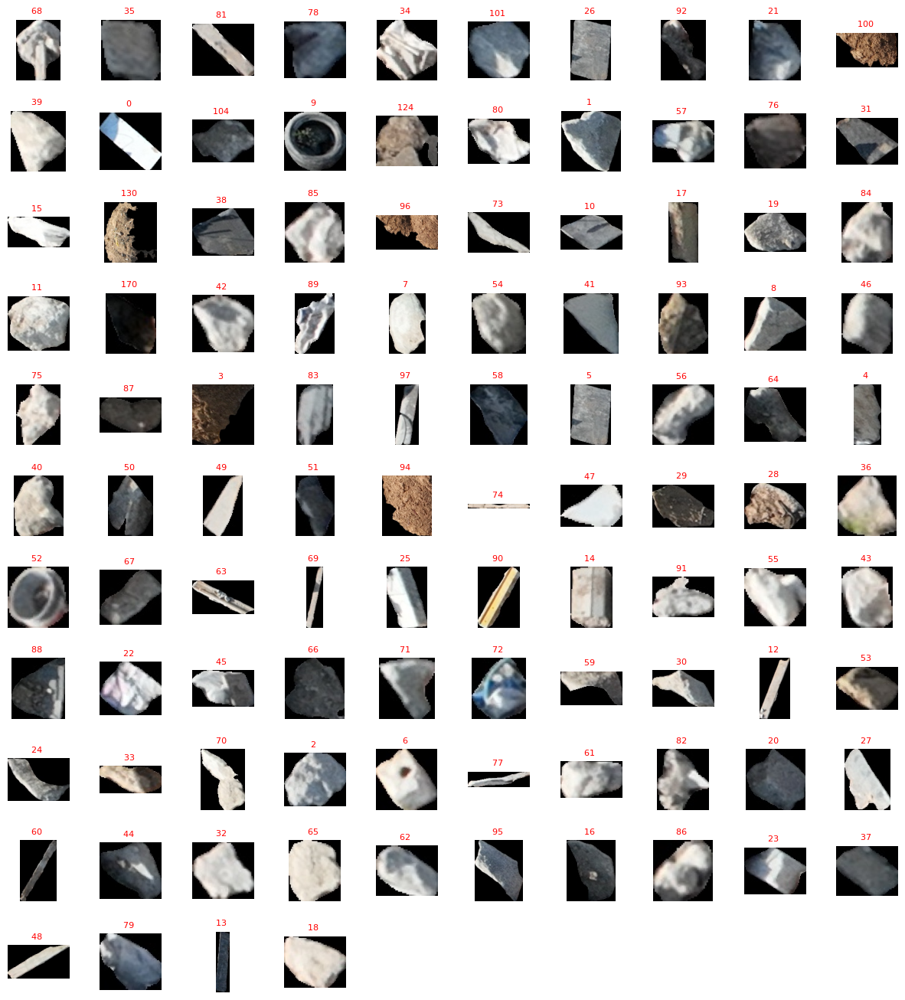

In [ ]:
#@markdown <font color='green'><font size=5>**4.  Show Masks**</font>
masks = "Not Annotated" #@param ["All", "Annotated", "Not Annotated"] {allow-input: true}
show_masks_grid(image, split, masks)

In [ ]:
import torch
import torchvision
from google.colab import drive
import json
import os
import yaml
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from skimage.feature import graycomatrix, graycoprops
from skimage import data



# drive.mount('/content/drive')
# print("PyTorch version:", torch.__version__)
# print("Torchvision version:", torchvision.__version__)
# print("CUDA is available:", torch.cuda.is_available())
# import sys
# !{sys.executable} -m pip install opencv-python matplotlib
# !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
# !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

# from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
# from segment_anything.utils.amg import *
# from pycocotools import mask as mask_utils

# sys.path.append("..")
# sam_checkpoint = "sam_vit_h_4b8939.pth"
# model_type = "vit_h"
# device = "cuda"
# sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
# sam.to(device=device)
# mask_generator = SamAutomaticMaskGenerator(sam)

Mounted at /content/drive
PyTorch version: 2.0.1+cu118
Torchvision version: 0.15.2+cu118
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-zs2d53oj
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-zs2d53oj
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36586 sha256=4d8b9b19783648b71b98f93376385f88373b0a366b29303679040ce97294f7c0
  Stored in directory: /tmp/pip-ephem-wheel-cache-n2koguge/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
--2023-08-29 17:31:34--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.3

In [ ]:
def get_box_from_mask(mask):
  mask = rle_to_mask(mask)
  pixel_list = np.argwhere(mask)
  min_x = min(pixel[1] for pixel in pixel_list)
  min_y = min(pixel[0] for pixel in pixel_list)
  max_x = max(pixel[1] for pixel in pixel_list)
  max_y = max(pixel[0] for pixel in pixel_list)
  box = [min_x, min_y, max_x, max_y]
  return box

In [ ]:
import yaml

# with open('/content/drive/MyDrive/Project/data/Yoni/DJI_20230221091105_0046_V/split_0/box_0.yaml') as f:
#     box_4 = yaml.safe_load(f)
box = {}
with open('/content/drive/MyDrive/Project/data3/DJI_20230629083037_0041_V/split_5/seg_5.yaml') as f:
    seg = yaml.safe_load(f)

In [ ]:
for im in seg:
  box[im]={}
  for sp in seg[im]:
    box[im][sp]={}
    for m in seg[im][sp]:
      box[im][sp][m] = [int(x) for x in get_box_from_mask(seg[im][sp][m]["segmentation"])]

In [ ]:
from google.colab import drive
from google.colab import auth
from googleapiclient.discovery import build
import json
import os
import yaml


drive.mount('/content/drive')
auth.authenticate_user()
drive_service = build('drive', 'v3')


folder_path = '/content/drive/MyDrive/Project/Project/data3'

# file_list = os.listdir(folder_path)
file_list = ['IMG_9240', 'MAX_0052', 'MAX_0206', 'MAX_0780', 'MAX_0792', 'MAX_1245', 'MAX_1250', 'MAX_1265']

mask_url = {}
split_url={}
box_dict={}

for image_name in file_list:
  im_path = f'{folder_path}/{image_name}'
  box_dict[image_name] = {}
  for sp in range(16):
    box_dict[image_name][f'split_{sp}']={}
    split_path = f'{im_path}/split_{sp}'
    with open(f'{split_path}/box_{sp}.yaml', 'r') as f:
        boxs = yaml.safe_load(f)
    for sp_num in boxs[image_name]:
      for mask in boxs[image_name][sp_num]:
        box_dict[image_name][f'split_{sp_num}'][mask] = boxs[image_name][sp_num][mask]
  folder_id = None
  page_token = None
  mask_url[image_name] = {}
  split_url[image_name] = {}
  query = "name='{}' and mimeType='application/vnd.google-apps.folder'".format(image_name)
  response = drive_service.files().list(q=query, fields='files(id)', pageSize=1000).execute()
  for folder in response.get('files', []):
      folder_id = folder.get('id')
      if folder_id:
          query = "'{}' in parents".format(folder_id)
          response = drive_service.files().list(q=query, fields='files(id, name)', pageSize=1000).execute()
          for file in response.get('files', []):
            if file['name'].startswith('split_'):
              mask_url[image_name][file['name']] = {}
              query = "'{}' in parents".format(file['id'])
              res = drive_service.files().list(q=query, fields='files(id, name)', pageSize=1000).execute()
              for f in res.get('files', []):
                  if f['name'].startswith("mask_") and f['name'].endswith('jpg'):
                      mask_url[image_name][file['name']][f['name'].split(".jpg")[0]] = f"https://drive.google.com/uc?id={f['id']}"
                  if f['name'].startswith("split_") and f['name'].endswith('jpg'):
                    split_url[image_name][f['name'].split(".jpg")[0]] = f"https://drive.google.com/uc?id={f['id']}"


with open("masks_Demolition.json", "w") as outfile:
    json.dump(mask_url, outfile)
with open("boxes_Demolition.json", "w") as outfile:
    json.dump(box_dict, outfile)
with open("splits_Demolition.json", "w") as outfile:
    json.dump(split_url, outfile)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
with open("masks_Gezer3.json", "w") as outfile:
    json.dump(mask_url, outfile)

In [ ]:
file_list

['DJI_20230629094130_0360_V',
 'DJI_20230629094118_0351_V',
 'DJI_20230629094038_0321_V',
 'DJI_20230629094003_0297_V',
 'DJI_20230629093922_0270_V',
 'DJI_20230629093851_0246_V',
 'DJI_20230629093840_0237_V',
 'DJI_20230629093753_0210_V',
 'DJI_20230629093734_0198_V',
 'DJI_20230629093649_0168_V',
 'DJI_20230629093636_0159_V',
 'DJI_20230629093631_0156_V',
 'DJI_20230629093617_0144_V',
 'DJI_20230629093613_0141_V',
 'DJI_20230629093606_0135_V',
 'DJI_20230629093559_0129_V',
 'DJI_20230629093446_0087_V',
 'DJI_20230629093403_0066_V',
 'DJI_20230629093351_0060_V',
 'DJI_20230629093339_0054_V',
 'DJI_20230629093303_0036_V']

In [ ]:
import os

# Navigate to the folder
folder_path = '/content/drive/MyDrive/Project/data3/DJI_20230629083037_0041_V'

# Get list of all files in the folder
file_names = os.listdir(folder_path)

# Loop through and rename
for file_name_ in file_names:
      sp_path = f'{folder_path}/{file_name_}'
      masks_list = [s for s in os.listdir(folder_path) if s.startswith("mask_")]
      for i,m in enumerate(masks_list):
        if m.endswith('.jpg') or m.endswith('.png'):  # adjust these conditions based on your requirements
            old_file_path = os.path.join(sp_path, m)
            new_file_name = f"{m}_{i}_"
            new_file_path = os.path.join(sp_path, new_file_name)
            os.rename(old_file_path, new_file_path)
            print(f"Renamed file {old_file_path} to {new_file_path}")


In [ ]:
from google.colab import drive
from google.colab import auth
from googleapiclient.discovery import build
import json
import os
import yaml

drive.mount('/content/drive')
auth.authenticate_user()
drive_service = build('drive', 'v3')
# /content/drive/MyDrive/Project/data3/DJI_20230629083037_0041_V/split_5
folder_path = '/content/drive/MyDrive/Project/data3/'
file_list = os.listdir(folder_path)

mask_url = {}
split_url = {}
box_dict = {}
splits=[5]
image_name = "DJI_20230629083037_0041_V"

im_path = f'{folder_path}/{image_name}'
print(im_path)
box_dict[image_name] = {}
for sp in splits:
    box_dict[image_name][f'split_{sp}'] = {}
    split_path = f'{im_path}/split_{sp}'
    with open(f'{split_path}/box_{sp}.yaml', 'r') as f:
        boxs = yaml.safe_load(f)
    for sp_num in boxs[image_name]:
        for mask in boxs[image_name][sp_num]:
            box_dict[image_name][f'split_{sp_num}'][mask] = boxs[image_name][sp_num][mask]

folder_id = None
mask_url[image_name] = {}
split_url[image_name] = {}
query = f"name='{image_name}' and mimeType='application/vnd.google-apps.folder'"
response = drive_service.files().list(q=query, fields='files(id)', pageSize=1000).execute()
folders = response.get('files', [])
if len(folders) > 0:
    folder_id = folders[-1].get('id')
print(folders)
print(folder_id)
if folder_id:
    query = f"'{folder_id}' in parents"
    response = drive_service.files().list(q=query, fields='files(id, name)', pageSize=1000).execute()
    files = response.get('files', [])
    for file in files:
        if file['name'].startswith('split_'):
            mask_url[image_name][file['name']] = {}
            query = f"'{file['id']}' in parents"
            res = drive_service.files().list(q=query, fields='files(id, name)', pageSize=1000).execute()
            nested_files = res.get('files', [])
            for f in nested_files:
                if f['name'].startswith("mask_") and f['name'].endswith('jpg'):
                    mask_url[image_name][file['name']][f['name'].split(".jpg")[0]] = f"https://drive.google.com/uc?id={f['id']}"
                elif f['name'].startswith("split_") and f['name'].endswith('jpg'):
                    split_url[image_name][f['name'].split(".jpg")[0]] = f"https://drive.google.com/uc?id={f['id']}"

with open("masks_.json", "w") as outfile:
    json.dump(mask_url, outfile)
with open("boxes_.json", "w") as outfile:
    json.dump(box_dict, outfile)
with open("splits_.json", "w") as outfile:
    json.dump(split_url, outfile)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Project/data3//DJI_20230629083037_0041_V
[{'id': '1lWMJHZNmI3tIyxzdFS5OvNhptEAtz9CT'}, {'id': '16vff7TWd7S6dlZRinQQww8uROGcTv_Eo'}, {'id': '1bFT5F4gu7SbtjtJcWRemYrdOXdgpEMCz'}]
1bFT5F4gu7SbtjtJcWRemYrdOXdgpEMCz


In [ ]:
folder_path = '/content/drive/MyDrive/Project/data/Arik'
os.listdir(folder_path)
for f in os.listdir(folder_path):
  print(f'"{f}",')

In [ ]:
from google.colab import drive
import json
import os
import yaml
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from skimage.feature import graycomatrix, graycoprops
from skimage import data



drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
json_path="/content/drive/MyDrive/Project/jsons/annotations.json"

with open(json_path, "r")as f:
  annsj = json.load(f)

In [ ]:
d={}
for im in annsj:
  for sp in annsj[im]:
    for ma in annsj[im][sp]:
      d[f'{im}-{sp}-{ma}']=annsj[im][sp][ma]



In [ ]:
d_val = list(set(d.values()))

In [ ]:
d2 = {x:[] for x in d_val}

In [ ]:
for item in d:
  d2[d[item]]+=[item]


In [ ]:
d2["Metal (general)"]

In [ ]:
fp = '/content/drive/MyDrive/Project/data3/'
for image_name in os.listdir(folder_path):

In [ ]:
fp=['/content/drive/MyDrive/Project/data/Yoni','/content/drive/MyDrive/Project/data/Arik','/content/drive/MyDrive/Project/data/Adi']
# folder_path = '/content/drive/MyDrive/Project/data/Yoni'
# file_list = os.listdir(folder_path)

anns = {}


for folder_path in fp:
  for image_name in os.listdir(folder_path):
      im_path = f'{folder_path}/{image_name}'
      anns[image_name] = {}
      for sp in range(16):
          anns[image_name][f'split_{sp}'] = {}
          split_path = f'{im_path}/split_{sp}'
          if f'anns_{sp}.yaml' in os.listdir(split_path):
            with open(f'{split_path}/anns_{sp}.yaml', 'r') as f:
                  ann = yaml.safe_load(f)
            for m in ann[image_name][sp]:
              if ann[image_name][sp][m]!="":
                anns[image_name][f'split_{sp}'][m]= ann[image_name][sp][m]

with open("anns.json", "w") as f:
    json.dump(anns,f)

In [ ]:
fp=['/content/drive/MyDrive/Project/data/Yoni','/content/drive/MyDrive/Project/data/Arik','/content/drive/MyDrive/Project/data/Adi']
# folder_path = '/content/drive/MyDrive/Project/data/Yoni'
# file_list = os.listdir(folder_path)

segs = {}


for folder_path in fp:
  for image_name in os.listdir(folder_path):
      im_path = f'{folder_path}/{image_name}'
      segs[image_name] = {}
      for sp in range(16):
          segs[image_name][f'split_{sp}'] = {}
          split_path = f'{im_path}/split_{sp}'
          with open(f'{split_path}/seg_{sp}.yaml', 'r') as f:
                seg = yaml.safe_load(f)
          for m in seg[image_name][sp]:
            segs[image_name][f'split_{sp}'][m]= seg[image_name][sp][m]['textures']

with open("segst.json", "w") as f:
    json.dump(segs,f)

In [ ]:
segst=segs.copy()

In [ ]:
for folder_path in fp:
  print(folder_path)
  for image_name in os.listdir(folder_path):
      print(image_name)
      for sp in range(16):
        for m in segs[image_name][f"split_{sp}"]:
          segs[image_name][f"split_{sp}"][m]=segs[image_name][f"split_{sp}"][m]['textures']



In [ ]:
with open("segs_textures.json", "w") as f:
    json.dump(segs,f)

In [ ]:
segs[list(segs.keys())[0]]["split_0"]["mask_0"].keys()

dict_keys(['area', 'bbox', 'crop_box', 'point_coords', 'predicted_iou', 'segmentation', 'stability_score', 'textures'])

In [ ]:



fp=['/content/drive/MyDrive/Project/data/Yoni','/content/drive/MyDrive/Project/data/Arik','/content/drive/MyDrive/Project/data/Adi']
# folder_path = '/content/drive/MyDrive/Project/data/Yoni'
# file_list = os.listdir(folder_path)

seg_textures = {}
seg_anns = {}

for folder_path in fp:
  for image_name in os.listdir(folder_path):
      im_path = f'{folder_path}/{image_name}'
      seg_textures[image_name] = {}
      for sp in range(16):
          split_path = f'{im_path}/split_{sp}'
          if  f'anns_{sp}.yaml' in os.listdir(split_path):
            with open(f'{split_path}/seg_{sp}.yaml', 'r') as f:
                seg = yaml.safe_load(f)
            with open(f'{split_path}/anns_{sp}.yaml', 'r') as f:
                  anns = yaml.safe_load(f)
            for mask_i in anns[image_name][sp]:
              if anns[image_name][sp][mask_i] not in ["Unknown", ""]:
                x = [float(i) for i in seg[image_name][sp][mask_i]['textures']]
                y = anns[image_name][sp][mask_i].split(" ")[0].split("/")[0]
                seg_anns[f'{image_name}_split_{sp}_{mask_i}']=[x,y]
                if f'split_{sp}' in seg_textures[image_name]:
                  seg_textures[image_name][f'split_{sp}'][mask_i]=[x,y]
                else:
                  seg_textures[image_name][f'split_{sp}']={mask_i:[x,y]}




with open("seg_anns.yaml", "w") as f:
    yaml.dump(seg_anns,f)

with open("seg_textures.yaml", "w") as f:
    yaml.dump(seg_textures,f)


In [ ]:
with open("seg_anns.yaml", "r") as f:
    seg_anns = yaml.safe_load(f)

with open("seg_textures.yaml", "r") as f:
    seg_textures = yaml.safe_load(f)

with open("annotations.json", "r") as f:
    annotations = json.load(f)

annotations_copy =annotations.copy()

In [ ]:
annotations_copy =annotations.copy()

In [ ]:
for im in seg_textures:
  if im not in annotations_copy:
    annotations_copy[im]={}
  for sp in seg_textures[im]:
    if sp not in annotations_copy[im]:
      annotations_copy[im][sp]={}
    for mask in seg_textures[im][sp]:
      if mask not in annotations_copy[im][sp]:
        annotations_copy[im][sp][mask]= seg_textures[im][sp][mask][-1]
      else:
        if annotations_copy[im][sp][mask]!=seg_textures[im][sp][mask][-1]:
          print(im,sp,mask,seg_textures[im][sp][mask][-1])



DJI_20230221091042_0037_V split_0 mask_0 Nylon
DJI_20230221091042_0037_V split_0 mask_1 Nylon
DJI_20230221091042_0037_V split_0 mask_10 Nylon
DJI_20230221091042_0037_V split_0 mask_13 Wood
DJI_20230221091042_0037_V split_0 mask_2 Nylon
DJI_20230221091042_0037_V split_0 mask_3 Nylon
DJI_20230221091042_0037_V split_0 mask_4 Metal
DJI_20230221091042_0037_V split_0 mask_5 Metal
DJI_20230221091042_0037_V split_0 mask_6 Wood
DJI_20230221091042_0037_V split_0 mask_8 Metal
DJI_20230221091300_0086_V split_0 mask_2 Concrete
DJI_20230221095222_0016_V split_0 mask_0 Wood
DJI_20230221095228_0020_V split_0 mask_1 Plastic
DJI_20230221095235_0022_V split_0 mask_0 Plastic
DJI_20230221095235_0022_V split_0 mask_1 Plastic
DJI_20230221095512_0069_V split_2 mask_0 Plastic
DJI_20230221095512_0069_V split_6 mask_0 Textil
DJI_20230221095630_0096_V split_0 mask_0 Plastic


In [ ]:
len(annotations_copy.keys())

93

In [ ]:

len(annotations.keys())

23

In [ ]:
with open("anns.json", "w") as f:
    json.dump(annotations_copy,f)

In [ ]:
image = np.array([[0, 0, 1, 1],
                  [0, 0, 1, 1],
                  [0, 2, 2, 2],
                  [2, 2, 3, 3]], dtype=np.uint8)
g = graycomatrix(image, [1, 2], [0, np.pi/2], levels=4, normed=True, symmetric=True)
contrast = graycoprops(g, 'contrast')
contrast


array([[0.58333333, 1.        ],
       [1.25      , 2.75      ]])

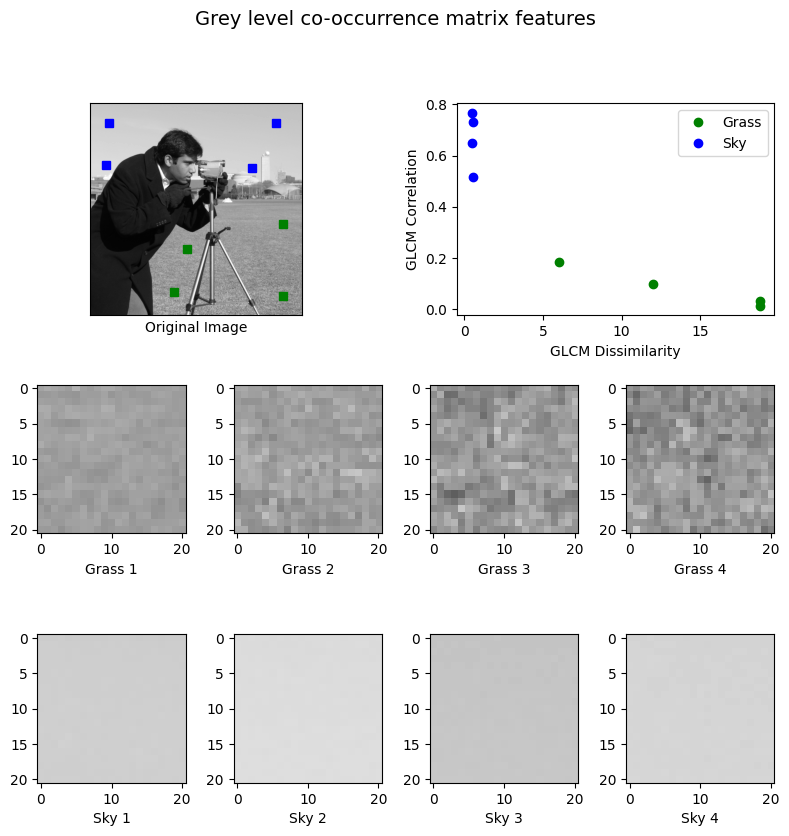

In [ ]:


PATCH_SIZE = 21

# open the camera image
image = data.camera()

# select some patches from grassy areas of the image
grass_locations = [(280, 454), (342, 223), (444, 192), (455, 455)]
grass_patches = []
for loc in grass_locations:
    grass_patches.append(image[loc[0]:loc[0] + PATCH_SIZE,
                               loc[1]:loc[1] + PATCH_SIZE])

# select some patches from sky areas of the image
sky_locations = [(38, 34), (139, 28), (37, 437), (145, 379)]
sky_patches = []
for loc in sky_locations:
    sky_patches.append(image[loc[0]:loc[0] + PATCH_SIZE,
                             loc[1]:loc[1] + PATCH_SIZE])

# compute some GLCM properties each patch
xs = []
ys = []
for patch in (grass_patches + sky_patches):
    glcm = graycomatrix(patch, distances=[5], angles=[0], levels=256,
                        symmetric=True, normed=True)
    xs.append(graycoprops(glcm, 'dissimilarity')[0, 0])
    ys.append(graycoprops(glcm, 'correlation')[0, 0])

# create the figure
fig = plt.figure(figsize=(8, 8))

# display original image with locations of patches
ax = fig.add_subplot(3, 2, 1)
ax.imshow(image, cmap=plt.cm.gray,
          vmin=0, vmax=255)
for (y, x) in grass_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'gs')
for (y, x) in sky_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'bs')
ax.set_xlabel('Original Image')
ax.set_xticks([])
ax.set_yticks([])
ax.axis('image')

# for each patch, plot (dissimilarity, correlation)
ax = fig.add_subplot(3, 2, 2)
ax.plot(xs[:len(grass_patches)], ys[:len(grass_patches)], 'go',
        label='Grass')
ax.plot(xs[len(grass_patches):], ys[len(grass_patches):], 'bo',
        label='Sky')
ax.set_xlabel('GLCM Dissimilarity')
ax.set_ylabel('GLCM Correlation')
ax.legend()

# display the image patches
for i, patch in enumerate(grass_patches):
    ax = fig.add_subplot(3, len(grass_patches), len(grass_patches)*1 + i + 1)
    ax.imshow(patch, cmap=plt.cm.gray,
              vmin=0, vmax=255)
    ax.set_xlabel(f"Grass {i + 1}")

for i, patch in enumerate(sky_patches):
    ax = fig.add_subplot(3, len(sky_patches), len(sky_patches)*2 + i + 1)
    ax.imshow(patch, cmap=plt.cm.gray,
              vmin=0, vmax=255)
    ax.set_xlabel(f"Sky {i + 1}")


# display the patches and plot
fig.suptitle('Grey level co-occurrence matrix features', fontsize=14, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
seg_anns_copy = seg_anns.copy()
seg_textures_copy = seg_textures.copy()

In [ ]:
seg_textures

{'IMG-20220821-WA0000': {'split_0': {'mask_0': [[-1.3991431814778101,
     0.15612295315473465,
     -0.16762686292552634,
     1.4106470912486024,
     -1.1755586798526974,
     -0.052625510489708295,
     -0.3505513993813613,
     1.578735589723767,
     1.484666357644952,
     -0.614287191547942,
     0.28579485034432267,
     -1.1561740164413312,
     1.5974811115750582,
     -0.6278114044221107,
     0.05543233409709425,
     -1.0251020412500418,
     1.3948529536761636,
     -0.1748763463900741,
     0.18989670057053404,
     -1.4098733078566195,
     1.6165248676391633,
     -0.6351183182929461,
     0.010242164732769874,
     -0.9916487140789889],
    'Metal'],
   'mask_1': [[-1.6986409025788471,
     0.3710636107148203,
     0.44504204829802896,
     0.8825352435659976,
     -1.6829620825024634,
     0.45234761405962076,
     0.2945158066994948,
     0.9360986617433472,
     1.710304241485491,
     -0.7436529106924868,
     -0.3180496049500607,
     -0.6486017258429417,
     1

In [ ]:
seg_anns.values()

In [ ]:
# Extract vectors and labels from the dictionary
vectors = [item[0] for item in seg_anns.values()]
labels = [item[1] for item in seg_anns.values()]
vals = [[item[1]]+item[0] for item in seg_anns.values()]
df = pd.DataFrame(columns=np.arange(25), data = vals)

In [ ]:
labels

In [ ]:
vectors

In [ ]:
df

In [ ]:
df.groupby(0).size()

In [ ]:
X = df.drop([0], axis=1).values

In [ ]:
scaler = StandardScaler()
X_s = scaler.fit_transform(X)

In [ ]:
pca = PCA(n_components=3)

_ = pca.fit(X_s)

In [ ]:
# get that loadings matrix W
W = pca.components_.T
W.shape, W[:, 0][:, np.newaxis]

In [ ]:
pca.explained_variance_ratio_[0],pca.explained_variance_ratio_[1]

(0.37375481627777246, 0.3462075517276614)

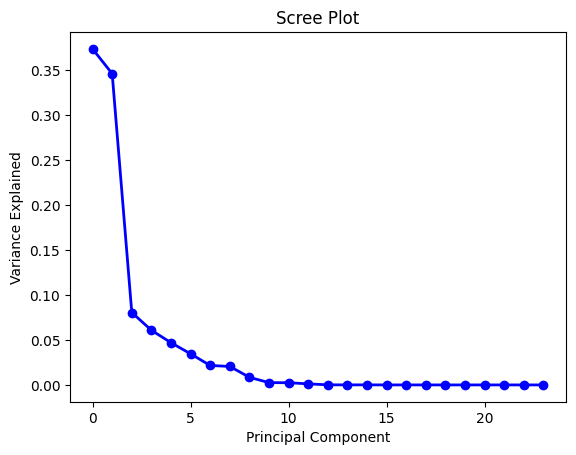

In [ ]:
plt.plot(np.arange(24), pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

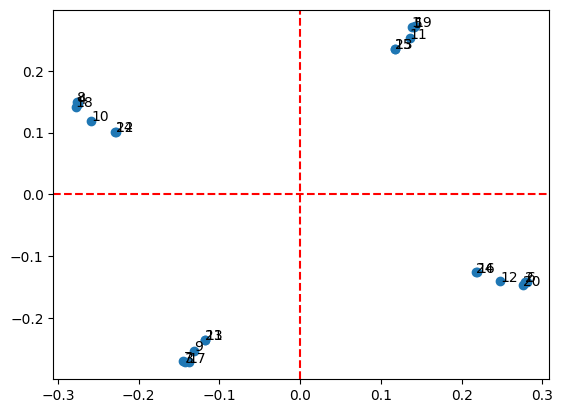

In [ ]:
w1 = W[:, 0]
w2 = W[:, 1]
plt.scatter(w1, w2)
plt.axhline(0, color='r', linestyle='--')
plt.axvline(0, color='r', linestyle='--')
for i, txt in enumerate(df.columns[1:]):
    plt.annotate(txt, (w1[i], w2[i]))
plt.show()

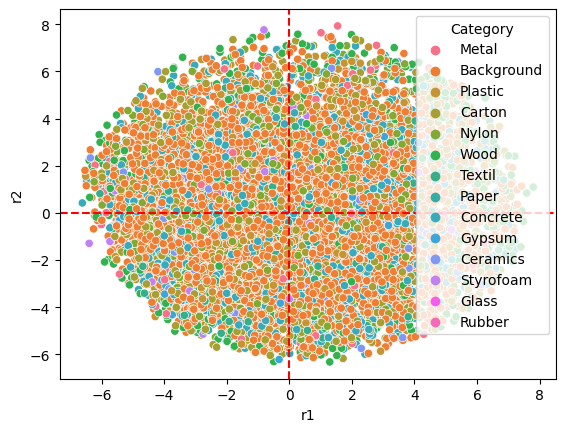

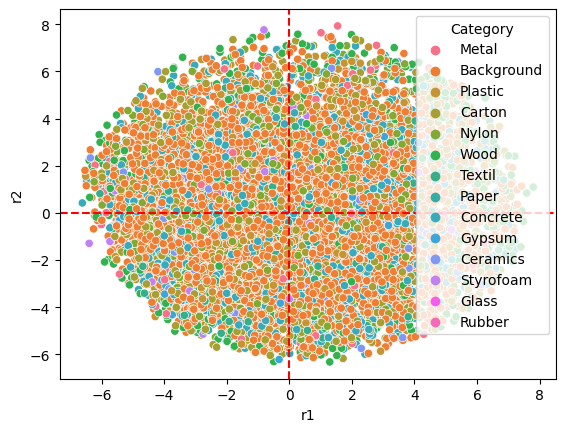

In [ ]:
# visualizing first 2 projections with observations, notice the transform method which takes care of multiplication for you
XW = pca.transform(X_s)
r1 = XW[:, 0]
r2 = XW[:, 1]


pca_df = pd.DataFrame({'r1': r1, 'r2': r2, 'Category': df[0]})
sns.scatterplot(x='r1', y='r2', hue='Category', data=pca_df)
plt.axhline(0, color='r', linestyle='--')
plt.axvline(0, color='r', linestyle='--')
plt.show()

pca_df = pd.DataFrame({'r1': r1, 'r2': r2, 'Category': labels})
sns.scatterplot(x='r1', y='r2', hue='Category', data=pca_df)
plt.axhline(0, color='r', linestyle='--')
plt.axvline(0, color='r', linestyle='--')
plt.show()

In [ ]:


# Convert the vectors to a numpy array
vector_array = np.array(vectors)

# Standardize the data (optional but can help with clustering performance)
# scaler = StandardScaler()
scaled_vector_array = vector_array

# Choose the number of clusters (you need to determine this based on your data)
num_clusters = 14

# Perform K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_vector_array)

# Assign cluster labels back to the original data
# for i, key in enumerate(seg_anns.keys()):
#     seg_anns[key].append(cluster_labels[i])

# Now the "data" dictionary contains the original vector, category label, and cluster label


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
# Print cluster assignments for each item
a,b=[],[]
c=[]
for item_key, cluster_label in zip(seg_anns.keys(), cluster_labels):
    #print(f"Item Key: {item_key}, Cluster Label: {cluster_label}, true label : {seg_anns[item_key][-1]}")
    a.append(cluster_label)
    b.append(seg_anns[item_key][-1])
    c.append([cluster_label,seg_anns[item_key][-1]])

# You can also access the cluster centers
cluster_centers = kmeans.cluster_centers_

In [ ]:
df2 = pd.DataFrame(columns=["pred", "real"], data=c)

In [ ]:
df2.groupby("real").size()

real
Background    5104
Carton        1111
Ceramics        90
Concrete      1528
Glass            1
Gypsum          38
Metal           89
Nylon          467
Paper           21
Plastic        609
Rubber           2
Styrofoam       35
Textil         163
Wood           586
dtype: int64

In [ ]:
df2.groupby("pred").size()

pred
0      860
1      805
2      918
3      648
4      629
5      793
6      799
7      420
8      678
9      540
10     113
11    1015
12     698
13     928
dtype: int64

In [ ]:
# _df = pd.DataFrame({'r1': a, 'r2': b})
# sns.scatterplot(x='r1', y='r2', hue=b, data=_df, size=)
# plt.show()

In [ ]:


silhouette_avg = silhouette_score(scaled_vector_array, cluster_labels)
print(f"Silhouette Score: {silhouette_avg}")
inertia = kmeans.inertia_
print(f"Inertia: {inertia}")


Silhouette Score: 0.16753358956494033
Inertia: 27380.27234128327


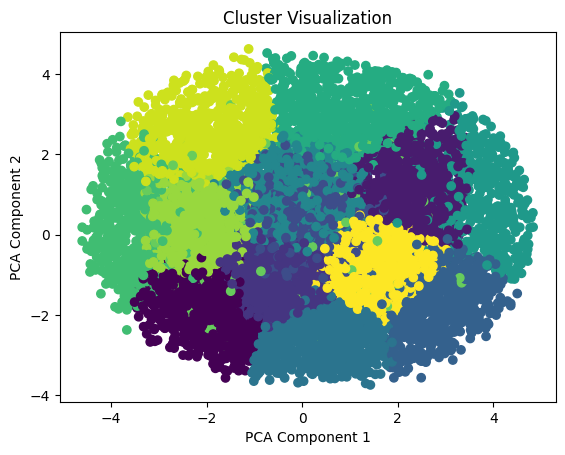

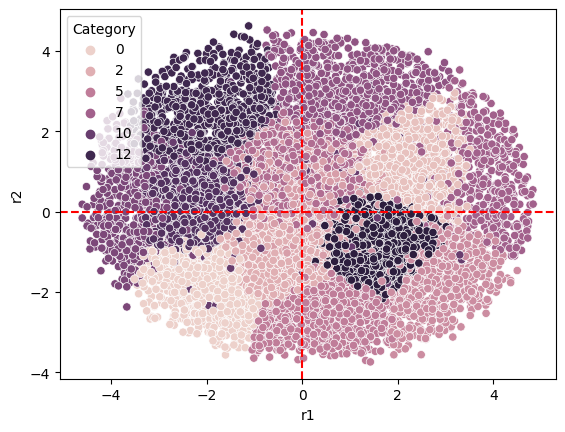

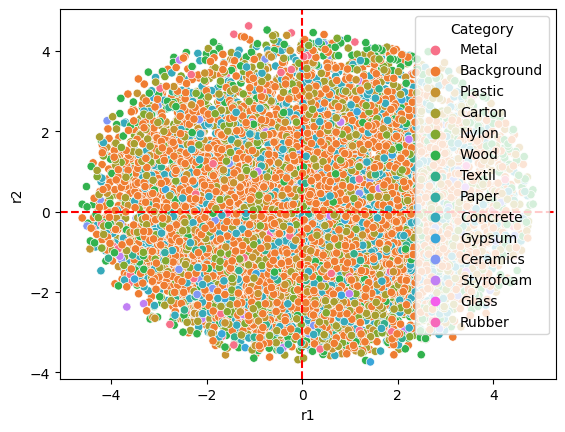

In [ ]:


# Reduce dimensions using PCA for visualization
pca = PCA(n_components=2)
pca_vectors = pca.fit_transform(scaled_vector_array)

plt.scatter(pca_vectors[:, 0], pca_vectors[:, 1], c=cluster_labels)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Cluster Visualization')
plt.show()
pca_df = pd.DataFrame({'r1': pca_vectors[:, 0], 'r2': pca_vectors[:, 1], 'Category': cluster_labels})
sns.scatterplot(x='r1', y='r2', hue='Category', data=pca_df)
plt.axhline(0, color='r', linestyle='--')
plt.axvline(0, color='r', linestyle='--')
plt.show()
pca_df = pd.DataFrame({'r1': pca_vectors[:, 0], 'r2': pca_vectors[:, 1], 'Category': labels})
sns.scatterplot(x='r1', y='r2', hue='Category', data=pca_df)
plt.axhline(0, color='r', linestyle='--')
plt.axvline(0, color='r', linestyle='--')
plt.show()